# MONO3D Pipeline Demo

This notebook demonstrates how to initialize and run the main pipelines (Odometry, Depth, Matching, TSDF) in the MONO3D framework. It loads the configuration, initializes the dataset, and runs each pipeline, showing how to use them for downstream tasks.

In [1]:
import sys

sys.path.append("/home/alberto/MONO3D/")
import torch
import yaml
from dotmap import DotMap
from dataset import SCARED
from pipelines.depth.depth import DepthPipeline
import matplotlib.pyplot as plt
from utilities.visualization import viewComparePixelMatches, log_rerun_camera
from pipelines.depth.tsdf import TSDistanceFeatureColorVolume

import rerun as rr
import rerun.blueprint as rrb
from utilities.dev_utils import embedding2color
from utilities import *

%load_ext autoreload
%autoreload 2

## Load Configuration

We load the configuration from the YAML file and convert it to a DotMap for easy access.

In [2]:
CONFIG_PATH = "../config_train.yaml"
with open(CONFIG_PATH, "r") as f:
    config_yaml = yaml.safe_load(f)
    config_parameters = config_yaml["parameters"]
    config_training_dict = {
        k: v.get("value") for k, v in config_parameters.items() if v is not None
    }
    config = DotMap(config_training_dict)

## Initialize Dataset

We use the `initialize_from_config` utility to create the dataset and dataloaders according to the config.

In [3]:
dataset = SCARED(
    path="/home/alberto/SCARED",
    vids=["v28"],
    frameskip=[32],
    fps=32,
    random_pose=False,
    height=config.IMAGE_HEIGHT,
    width=config.IMAGE_WIDTH,
    with_depth=True,
    unit_translation=False,
)
dataloader = torch.utils.data.DataLoader(dataset, batch_size=1, sampler=dataset.sampler)
iloader = iter(dataloader)
sample = next(iloader)
# Print sample keys and shapes
for k, v in sample.items():
    if hasattr(v, "shape"):
        print(f"{k}: Tensor of shape {list(v.shape)}")
    else:
        print(f"{k}: {type(v)}")

idx: Tensor of shape [1]

framestack: Tensor of shape [1, 2, 3, 384, 384]

Ts2t: Tensor of shape [1, 6]

depthstack: Tensor of shape [1, 2, 1, 384, 384]

paths: <class 'list'>

frameskip: Tensor of shape [1]

intrinsics: Tensor of shape [1, 3, 3]

fundamental: Tensor of shape [1, 3, 3]

Ts: Tensor of shape [1, 4, 4]

Tt: Tensor of shape [1, 4, 4]

## Initialize Pipelines

We now initialize the main pipelines: Odometry, Depth, Matching, and TSDF.

In [4]:
# config.BACKBONE_SIZe="beit-base-384"
# odometryPipeline = OdometryPipeline(
#     config, model="winter-sweep-13", tqdm=True, to_rerun=True, device="cuda"
# )
# matchingPipeline = MatchingPipeline(config, model="winter-sweep-13", device="cuda")
# Initialize pipeline with rerun logging
rr.init("FeatureTSDF")
rr.serve(web_port=0, ws_port=0)
depthPipeline = DepthPipeline(config, model="", device="cuda", to_rerun=True)

[2025-06-22T19:16:01Z INFO  re_ws_comms::server] Hosting a WebSocket server on ws://localhost:34231. You can connect to this with a native viewer (`rerun ws://localhost:34231`) or the web viewer (with `?url=ws://localhost:34231`).
[2025-06-22T19:16:01Z INFO  re_sdk::web_viewer] Hosting a web-viewer at http://localhost:43535?url=ws://localhost:34231


## Run Odometry Pipeline

We process the dataset with the odometry pipeline. This will estimate the camera trajectory and other outputs.

In [5]:
# odoout = odometryPipeline.process_dataset(dataset, compute_gt=True)

## Run Depth Pipeline

We estimate depth for a sample from the dataset.

In [6]:
import torch.nn.functional as F

raycasted_features_multires = []
for featurelevel in [0, 1, 2, 3]:
    tsd = TSDistanceFeatureColorVolume(
        vol_bnds=[(-112, 112), (-112, 112), (-112, 112)],
        voxel_size=1,
        margin=40,
        feature_vector_length=768,
    )
    # rr.log("/", rr.ViewCoordinates.RIGHT_HAND_Y_DOWN)

    for s, sample in enumerate(dataloader):
        if s == 0:
            origin = sample["Ts"][0].cuda()
        sample = {k: v.cuda() for k, v in sample.items() if isinstance(v, torch.Tensor)}

        sample["depthnorm"] = depthPipeline.depth(sample["framestack"]).cuda()
        # sample["features"] = depthPipeline.model.embed(sample["framestack"])[0:1].cuda()
        sample["features_multires_chw"] = depthPipeline.model.embed(
            sample["framestack"][:, 0], mode="chw", multires=True
        )
        sample["features_multires_seq"] = depthPipeline.model.embed(
            sample["framestack"][:, 0], mode="seq", multires=True
        )
        sample["features"] = sample["features_multires_chw"][featurelevel]

        # sample["features1"] = depthPipeline.model.embed(sample["framestack"][:, 1]).cuda()
        if s == 0:
            em, pca = embedding2color(sample["features"])
        else:
            em = embedding2color(sample["features"], pca=pca)
        sample["depthnorm"] = sample["depthnorm"]  # * 40 +20
        K = sample["intrinsics"][0]
        T = torch.inverse(torch.inverse(origin) @ sample["Ts"][0].cuda())
        if s == 0:
            tsd.integrate(
                frame=sample["framestack"][0, 0],  # Already in [3, H, W] format
                depthmap=sample["depthnorm"][0].unsqueeze(
                    0
                ),  # Convert to [1, H, W] format
                K=K,
                T=T.cuda(),
                featuremap=sample["features"][0],  # Already in [E, H, W] format
                weights=1.0,
            )
        verts_world, faces, norms, colors = tsd.get_mesh(
            threshold=0.1, feature_as_colors=True, pca=pca
        )
        raycasted_depth = tsd.raycast(
            K, T.cuda(), 384, 384, near=-100, far=200, n_samples=1000
        )
        raycasted_features = (
            tsd.raycast_features(
                K, T.cuda(), 384, 384, near=-100, far=200, n_samples=500
            )
            .permute(2, 0, 1)
            .unsqueeze(0)[..., 7::16, 7::16]
        )
        raycasted_features_multires.append(raycasted_features)
        raycasted_features_rgb = embedding2color(raycasted_features, pca=pca)
        log_rerun_camera(K, T, entity=f"/camera_{s}")
        rr.log(
            "/3d",
            rr.Mesh3D(
                vertex_positions=verts_world,
                triangle_indices=faces,
                vertex_normals=norms,
                vertex_colors=colors,
            ),
        )
        rr.log("/rgb", rr.Image(sample["framestack"][0, 0].permute(1, 2, 0) * 255))
        rr.log("/features", rr.Image(em[0].permute(1, 2, 0) * 255))
        # rr.log(f"/3d/camera_{s}", rr.Image(sample["framestack"][0, 0].permute(1, 2, 0) * 255))
        rr.log("/depth", rr.DepthImage(sample["depthnorm"][0:1].permute(1, 2, 0)))
        rr.log("/raycasted_depth", rr.DepthImage(raycasted_depth.permute(1, 2, 0)))
        raycasted_features_upsampled = F.interpolate(
            raycasted_features_rgb[0].unsqueeze(0), size=(384, 384), mode="bilinear"
        )
        rr.log(
            f"/camera_{s}/raycasted_features",
            rr.Image(raycasted_features_upsampled[0].permute(1, 2, 0) * 255),
        )
        # rr.log(f"/3d/depth_camera_{s}", rr.DepthImage(raycasted_depth.permute(1, 2, 0)))
        if s == 0:
            break

raycasted_features_multires_seq = [
    torch.cat([torch.zeros(1, 1, 768, device=f.device), chw2embedding(f, True)], dim=1)
    for f in raycasted_features_multires
]

OutOfMemoryError: CUDA out of memory. Tried to allocate 32.16 GiB. GPU 0 has a total capacity of 15.77 GiB of which 12.52 GiB is free. Process 163539 has 1.78 GiB memory in use. Including non-PyTorch memory, this process has 1.46 GiB memory in use. Of the allocated memory 988.93 MiB is allocated by PyTorch, and 101.07 MiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://pytorch.org/docs/stable/notes/cuda.html#environment-variables)

In [9]:
tsd.feature.shape

torch.Size([56, 56, 56, 768])

In [7]:
# 200:384=x:24
# 1:384=x:24
224 * 24 / 384
# 24

14.0

In [15]:
(tsd.volume_bounds[0, 1] - tsd.volume_bounds[0, 0]) / 16

tensor(12.5000, device='cuda:0')

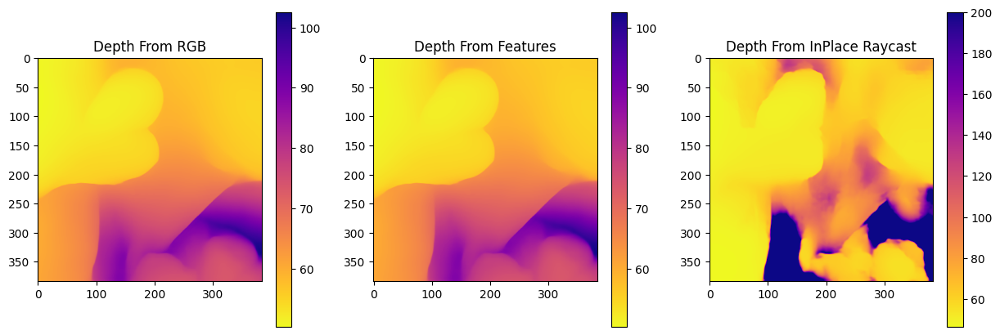

In [9]:
# Add CLS token (zeros) to each tensor in list, shape: [1, 576, 768] -> [1, 577, 768]
raycasted_features_multires_seq = [
    torch.cat([torch.zeros(1, 1, 768, device=f.device), chw2embedding(f, True)], dim=1)
    for f in raycasted_features_multires
]
# print([e.shape for e in raycasted_features_multires_seq])
# print([e.shape for e in raycasted_features_multires_seq])

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
depthmap = depthPipeline.depth(sample["framestack"].cuda())
plt.imshow(depthmap[0].cpu())
plt.colorbar()
plt.title("Depth From RGB")

plt.subplot(1, 3, 2)
depthmap = depthPipeline.depth(sample["features_multires_seq"])
plt.imshow(depthmap[0].cpu())
plt.colorbar()
plt.title("Depth From Features")

plt.subplot(1, 3, 3)
depthmap = depthPipeline.depth(raycasted_features_multires_seq)
depthmap[depthmap > 200] = 200
plt.imshow(depthmap[0].cpu())
plt.colorbar()
plt.title("Depth From InPlace Raycast")

plt.show()

In [7]:
xyz, rgb = tsd.get_point_cloud(
    threshold=0.05, feature_as_colors=True, extract_from_features=True, pca=pca
)
rr.log("/pc/rgbff", rr.Points3D(positions=xyz, colors=rgb, radii=3.0))
xyz, rgb = tsd.get_point_cloud(
    threshold=0.05, feature_as_colors=False, extract_from_features=True, pca=pca
)
rr.log("/pc/rgb", rr.Points3D(positions=xyz, colors=rgb, radii=1.0))

In [8]:
# Create volumetric 3D plot of RGB volume using plotly - Combined visualization
import plotly.graph_objects as go
import numpy as np

# Get RGB volume data and coordinates
feature_vol = tsd.feature  # .cpu() / 255.0  # Normalize to [0,1]
feature_seq = feature_vol.reshape(-1, 768)
feature_chw = embedding2chw(feature_seq, True)
feature_vol_rgb = (
    embedding2color(feature_chw, pca=pca)[0].permute(2, 1, 0).reshape(13, 13, 13, 3)
)
# First dataset - feature_vol_rgb
rgb_vol_1 = feature_vol_rgb.cpu().numpy()  # / 255.0  # Normalize to [0,1]

# Create mask for bright enough colors (first dataset)
bright_mask_1 = (rgb_vol_1 > 0.4).all(axis=-1)

# Get coordinates and filter by brightness (first dataset)
x1, y1, z1 = np.meshgrid(
    np.arange(rgb_vol_1.shape[0]),
    np.arange(rgb_vol_1.shape[1]),
    np.arange(rgb_vol_1.shape[2]),
)

x_bright_1 = x1[bright_mask_1]
y_bright_1 = y1[bright_mask_1]
z_bright_1 = z1[bright_mask_1]
rgb_bright_1 = rgb_vol_1[bright_mask_1]

# Convert RGB values to plotly color format (first dataset)
colors_1 = [
    f"rgb({r * 255:.0f},{g * 255:.0f},{b * 255:.0f})" for r, g, b in rgb_bright_1
]

# Second dataset - tsd.color
rgb_vol_2 = tsd.color.cpu().numpy() / 255.0  # Normalize to [0,1]

# Create mask for bright enough colors (second dataset)
bright_mask_2 = (rgb_vol_2 > 0.1).all(axis=-1)

# Get coordinates and filter by brightness (second dataset)
x2, y2, z2 = np.meshgrid(
    np.arange(rgb_vol_2.shape[0]),
    np.arange(rgb_vol_2.shape[1]),
    np.arange(rgb_vol_2.shape[2]),
)

x_bright_2 = x2[bright_mask_2]
y_bright_2 = y2[bright_mask_2]
z_bright_2 = z2[bright_mask_2]
rgb_bright_2 = rgb_vol_2[bright_mask_2]

# Convert RGB values to plotly color format (second dataset)
colors_2 = [
    f"rgb({r * 255:.0f},{g * 255:.0f},{b * 255:.0f})" for r, g, b in rgb_bright_2
]

# Offset the second dataset to appear above the first
# Calculate the maximum z-coordinate of the first dataset and add some spacing
z_offset = np.max((z_bright_1 * 16 + 7) / 2) + 20  # Add 20 units of spacing

# Create combined 3D scatter plot
fig = go.Figure(
    data=[
        # First dataset (bottom)
        go.Scatter3d(
            x=(x_bright_1 * 16),  # *16+7),
            y=(y_bright_1 * 16),  # *16+7),
            z=(z_bright_1 * 16),  # *16+7),
            mode="markers",
            marker=dict(size=10, color=colors_1, opacity=0.8),
            name="Feature Volume RGB",
        ),
        # Second dataset (top)
        go.Scatter3d(
            x=x_bright_2,
            y=y_bright_2,
            z=z_bright_2,  # + z_offset,  # Offset to place above first dataset
            mode="markers",
            marker=dict(size=3, color=colors_2, opacity=0.4),
            name="TSD Color Volume",
        ),
    ]
)

# Update layout
fig.update_layout(
    title="Combined RGB Volume Visualization",
    scene=dict(xaxis_title="X", yaxis_title="Y", zaxis_title="Z"),
    width=800,
    height=800,
    showlegend=True,
)

fig.show()

# Log to Rerun
# First point cloud - Feature Volume RGB
positions_1 = torch.tensor(
    np.stack([x_bright_1 * 16, y_bright_1 * 16, z_bright_1 * 16], axis=1)
)
colors_1_rgb = torch.tensor(rgb_bright_1 * 255, dtype=torch.uint8)
rr.log(
    "/feature_volume",
    rr.Points3D(positions=positions_1, colors=colors_1_rgb, radii=10.0),
)

# Second point cloud - TSD Color Volume
positions_2 = torch.tensor(np.stack([x_bright_2, y_bright_2, z_bright_2], axis=1))
colors_2_rgb = torch.tensor(rgb_bright_2 * 255, dtype=torch.uint8)
rr.log("/tsd_color", rr.Points3D(positions=positions_2, colors=colors_2_rgb, radii=3.0))

RuntimeError: shape '[13, 13, 13, 3]' is invalid for input of size 3000000

In [14]:
tsd.get_point_cloud(include_features=False)

ValueError: Surface level must be within volume data range.

In [ ]:
# Create volumetric 3D plot of RGB volume using plotly
import plotly.graph_objects as go

# Get RGB volume data and coordinates
rgb_vol = feature_vol_rgb.cpu().numpy()  # / 255.0  # Normalize to [0,1]

# Create mask for bright enough colors
bright_mask = (rgb_vol > 0.4).all(axis=-1)

# Get coordinates and filter by brightness
x, y, z = np.meshgrid(
    np.arange(rgb_vol.shape[0]),
    np.arange(rgb_vol.shape[1]),
    np.arange(rgb_vol.shape[2]),
)

x_bright = x[bright_mask]
y_bright = y[bright_mask]
z_bright = z[bright_mask]
rgb_bright = rgb_vol[bright_mask]

# Convert RGB values to plotly color format
colors = [f"rgb({r * 255:.0f},{g * 255:.0f},{b * 255:.0f})" for r, g, b in rgb_bright]

# Create 3D scatter plot
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=(x_bright * 16 + 7) / 2,
            y=(y_bright * 16 + 7) / 2,
            z=(z_bright * 16 + 7) / 2,
            mode="markers",
            marker=dict(size=10, color=colors, opacity=0.8),
        )
    ]
)

# Update layout
fig.update_layout(
    title="RGB Volume Visualization (Bright Colors Only)",
    scene=dict(xaxis_title="X", yaxis_title="Y", zaxis_title="Z"),
    width=600,
    height=600,
)

fig.show()

In [116]:
# Create volumetric 3D plot of RGB volume using plotly
import plotly.graph_objects as go

# Get RGB volume data and coordinates
rgb_vol = tsd.color[::2, ::2, ::2].cpu().numpy() / 255.0  # Normalize to [0,1]

# Create mask for bright enough colors
bright_mask = (rgb_vol > 0.1).all(axis=-1)

# Get coordinates and filter by brightness
x, y, z = np.meshgrid(
    np.arange(rgb_vol.shape[0]),
    np.arange(rgb_vol.shape[1]),
    np.arange(rgb_vol.shape[2]),
)

x_bright = x[bright_mask]
y_bright = y[bright_mask]
z_bright = z[bright_mask]
rgb_bright = rgb_vol[bright_mask]

# Convert RGB values to plotly color format
colors = [f"rgb({r * 255:.0f},{g * 255:.0f},{b * 255:.0f})" for r, g, b in rgb_bright]

# Create 3D scatter plot
fig = go.Figure(
    data=[
        go.Scatter3d(
            x=x_bright,
            y=y_bright,
            z=z_bright,
            mode="markers",
            marker=dict(size=3, color=colors, opacity=0.4),
        )
    ]
)

# Update layout
fig.update_layout(
    title="RGB Volume Visualization (Bright Colors Only)",
    scene=dict(xaxis_title="X", yaxis_title="Y", zaxis_title="Z"),
    width=600,
    height=600,
)

fig.show()

In [21]:
v = np.arange(384)
v[8::16]

array([  8,  24,  40,  56,  72,  88, 104, 120, 136, 152, 168, 184, 200,
       216, 232, 248, 264, 280, 296, 312, 328, 344, 360, 376])

In [124]:
print([e.shape for e in raycasted_features_multires])
print([e.shape for e in sample["features_multires_chw"]])
print([e.shape for e in sample["features_multires_seq"]])

[
    torch.Size([1, 768, 24, 24]),
    torch.Size([1, 768, 24, 24]),
    torch.Size([1, 768, 24, 24]),
    torch.Size([1, 768, 24, 24])
]

[
    torch.Size([1, 768, 24, 24]),
    torch.Size([1, 768, 24, 24]),
    torch.Size([1, 768, 24, 24]),
    torch.Size([1, 768, 24, 24])
]

[torch.Size([1, 577, 768]), torch.Size([1, 577, 768]), torch.Size([1, 577, 768]), torch.Size([1, 577, 768])]

In [ ]:
tsd.raycast_features(K, T.cuda(), 384, 384, near=-100, far=200, n_samples=1000).permute(
    2, 0, 1
).unsqueeze(0).shape
rgb(
    embedding2color(
        tsd.raycast_features(K, T.cuda(), 384, 384, near=-100, far=200, n_samples=1000)
        .permute(2, 0, 1)
        .unsqueeze(0),
        pca=pca,
    )[0]
)
rgb(raycasted_features_rgb[0], scale=16)

TypeError: 'numpy.ndarray' object is not callable

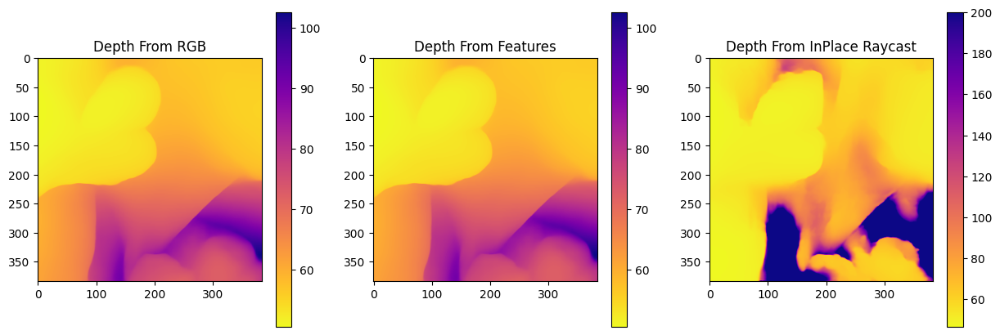

In [ ]:
# Add CLS token (zeros) to each tensor in list, shape: [1, 576, 768] -> [1, 577, 768]
raycasted_features_multires_seq = [
    torch.cat([torch.zeros(1, 1, 768, device=f.device), chw2embedding(f, True)], dim=1)
    for f in raycasted_features_multires
]
# print([e.shape for e in raycasted_features_multires_seq])
# print([e.shape for e in raycasted_features_multires_seq])

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
depthmap = depthPipeline.depth(sample["framestack"].cuda())
plt.imshow(depthmap[0].cpu())
plt.colorbar()
plt.title("Depth From RGB")

plt.subplot(1, 3, 2)
depthmap = depthPipeline.depth(sample["features_multires_seq"])
plt.imshow(depthmap[0].cpu())
plt.colorbar()
plt.title("Depth From Features")

plt.subplot(1, 3, 3)
depthmap = depthPipeline.depth(raycasted_features_multires_seq)
depthmap[depthmap > 200] = 200
plt.imshow(depthmap[0].cpu())
plt.colorbar()
plt.title("Depth From InPlace Raycast")

plt.show()

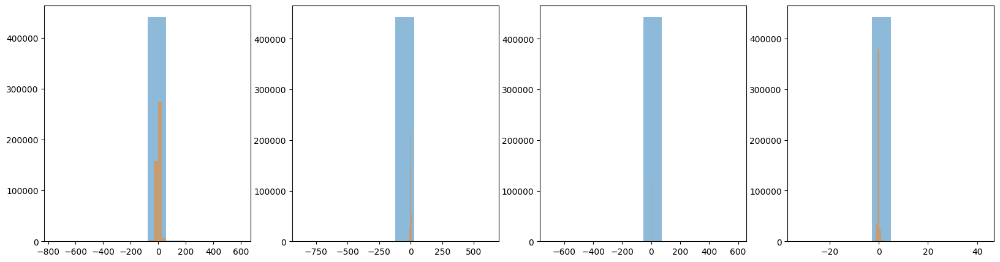

In [173]:
plt.figure(figsize=(20, 5))
plt.subplot(1, 4, 1)
plt.hist(
    sample["features_multires_seq"][-1].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
plt.hist(
    raycasted_features_multires_seq[-1].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
# plt.xlim(-100,100)
plt.subplot(1, 4, 2)
plt.hist(
    sample["features_multires_seq"][-2].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
plt.hist(
    raycasted_features_multires_seq[-2].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
# plt.xlim(-100,100)
plt.subplot(1, 4, 3)
plt.hist(
    sample["features_multires_seq"][-3].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
plt.hist(
    raycasted_features_multires_seq[-3].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
# plt.xlim(-100,100)
plt.subplot(1, 4, 4)
plt.hist(
    sample["features_multires_seq"][-4].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
plt.hist(
    raycasted_features_multires_seq[-4].flatten().cpu().numpy(), alpha=0.5
)  # ,bins=np.linspace(-100,100,100))
# plt.xlim(-100,100)
plt.show()

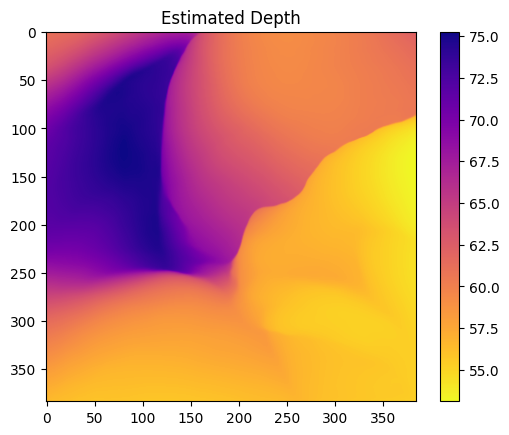

In [105]:
depthmap = depthPipeline.depth(sample["framestack"].cuda())
plt.imshow(depthmap[0].cpu())
plt.colorbar()
plt.title("Estimated Depth")
plt.show()

## Run Matching Pipeline

We run the matching pipeline to find correspondences between frames.

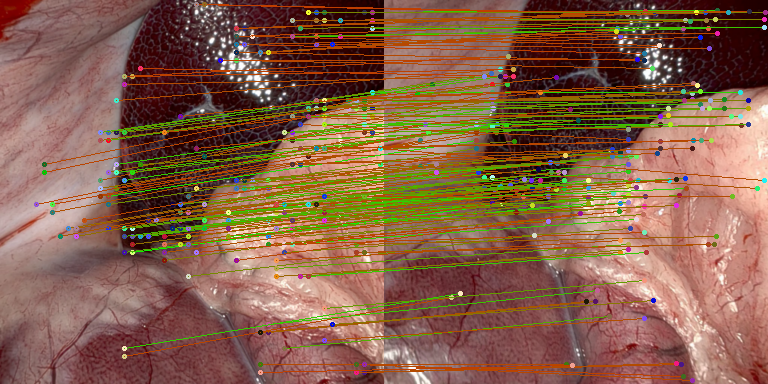

In [24]:
match = matchingPipeline.match_images(sample["framestack"].cuda())
viewComparePixelMatches(
    img1=sample["framestack"][0, 0].cuda(),
    img2=sample["framestack"][0, 1].cuda(),
    pts1=match["source_pixels_matched"],
    pts2=match["target_pixels_matched"],
    pts2_true=match["target_pixels_matched"],
    scores=match["scores"],
    topk=200,
)

## Run TSDF Integration

We integrate the estimated depth and color into a TSDF volume for 3D reconstruction.

In [ ]:
import rerun as rr

rr.init("TSDF")
rr.serve(web_port=0, ws_port=0)
bp = rrb.Blueprint(
    rrb.Vertical(
        rrb.Spatial3DView(origin="/", name="3D"),
        rrb.Horizontal(
            rrb.Spatial2DView(origin="/rgb", name="rgb"),
            *[
                rrb.Spatial2DView(origin=f"/slice_{i}", name=f"Slice {i}")
                for i in range(5, 10)
            ],
        ),
        row_shares=[0.7, 0.3],
    )
)
rr.send_blueprint(bp)
rr.log("/", rr.ViewCoordinates.RIGHT_HAND_Y_DOWN)
tsdf_vol = TSDistanceFeatureColorVolume(
    vol_bnds=[(-112, 112), (-112, 112), (-112, 112)],
    voxel_size=1,
    margin=40,
)
loss_list = []
for s, sample in enumerate(dataloader):
    if s == 0:
        origin = sample["Ts"][0].cuda()
    sample = {k: v.cuda() for k, v in sample.items() if isinstance(v, torch.Tensor)}
    sample["depthnorm"] = depthPipeline.depth(sample["framestack"]).cuda()
    sample["depthnorm"] = sample[
        "depthnorm"
    ]  # * config.DEPTH_SCALE_FACTOR + config.DEPTH_BIAS_FACTOR
    K = sample["intrinsics"][0]
    T = torch.inverse(torch.inverse(origin) @ sample["Tt"][0].cuda())
    log_rerun_camera(K, T.cuda())
    tsdf_vol.integrate(
        frame=sample["framestack"][0, 0].permute(1, 2, 0),
        depthmap=sample["depthnorm"][0:1],
        K=K,
        T=T.cuda(),
    )
    verts_world, faces, norms, colors = tsdf_vol.get_mesh(
        threshold=0.2,
        # include_features=False,
    )
    rr.log(
        "/3d",
        rr.Mesh3D(
            vertex_positions=verts_world,
            triangle_indices=faces,
            vertex_normals=norms,
            vertex_colors=colors,
        ),
    )
    rr.log("/rgb", rr.Image(sample["framestack"][0, 0].permute(1, 2, 0) * 255))
    #

[2025-06-22T19:17:58Z INFO  re_ws_comms::server] Shutting down Rerun server on ws://localhost:33221 after serving 1 client(s)
[2025-06-22T19:17:58Z INFO  re_ws_comms::server] Hosting a WebSocket server on ws://localhost:37081. You can connect to this with a native viewer (`rerun ws://localhost:37081`) or the web viewer (with `?url=ws://localhost:37081`).
[2025-06-22T19:17:58Z INFO  re_sdk::web_viewer] Hosting a web-viewer at http://localhost:32887?url=ws://localhost:37081


ValueError: Surface level must be within volume data range.

---
This notebook showed how to initialize and run the main MONO3D pipelines. You can now use these pipelines for further research and development.

In [14]:
sample["depthnorm"][0:1].max()

tensor(4275.5332, device='cuda:0')